<a href="https://colab.research.google.com/github/ElisaAnes/DSP_1/blob/main/DSP_Processamento_de_Audio_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1) Criar uma função para gerar um tom senoidal.

Parâmetros de entrada: frequência (Hz), duração (s), amplitude (0 a 1) e frequência de amostragem (Hz).

Verfique se a frequência da saída está correta medindo um período do sinal.

s440 = tonegen(440, 0.1, 0.8, 8000)
plt.plot(s440,'bo', s440, 'k')




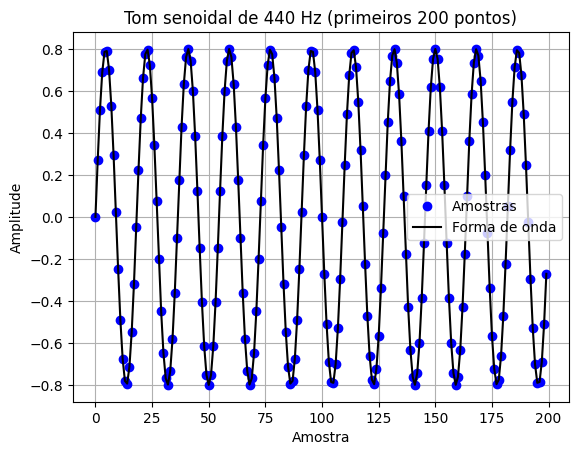

Número de amostras por ciclo: 18
Frequência estimada: 444.44 Hz


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display
from scipy.signal import find_peaks

def tonegen(freq, duration, amplitude, fs):
    """
    Gera um tom senoidal.
    """
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    signal = amplitude * np.sin(2 * np.pi * freq * t)
    return signal

def verificar_frequencia(signal, fs):
    """
    Estima a frequência do sinal com base na distância entre dois picos consecutivos.
    """
    peaks, _ = find_peaks(signal)

    if len(peaks) < 2:
        print("Não foi possível detectar dois picos.")
        return None

    # Número de amostras entre os dois primeiros picos
    periodo_amostras = peaks[1] - peaks[0]

    # Frequência estimada
    freq_estimada = fs / periodo_amostras
    print(f"Número de amostras por ciclo: {periodo_amostras}")
    print(f"Frequência estimada: {freq_estimada:.2f} Hz")
    return freq_estimada

# Gerar e verificar o tom de 440 Hz
fs = 8000
s440 = tonegen(440, 0.1, 0.8, fs)

# Plotar forma de onda (primeiras 200 amostras)
plt.plot(s440[:200], 'bo', label='Amostras')
plt.plot(s440[:200], 'k', label='Forma de onda')
plt.title("Tom senoidal de 440 Hz (primeiros 200 pontos)")
plt.xlabel("Amostra")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()
plt.show()

# Verificar frequência
verificar_frequencia(s440, fs)

# Tocar o som (em Colab ou Jupyter)
display(Audio(s440, rate=fs))


2) Criar uma função que receba um vetor com uma sequência de dígitos e gere tons DTMF correspondentes. Os parâmetros de entrada da função são: sequência de dígitos, duração em segundos de cada dígito, intervalo em segundos entre cada dígito e amplitude (0 a 1). O sinal de saída deve ter frequência de amostragem de 8 kHz.

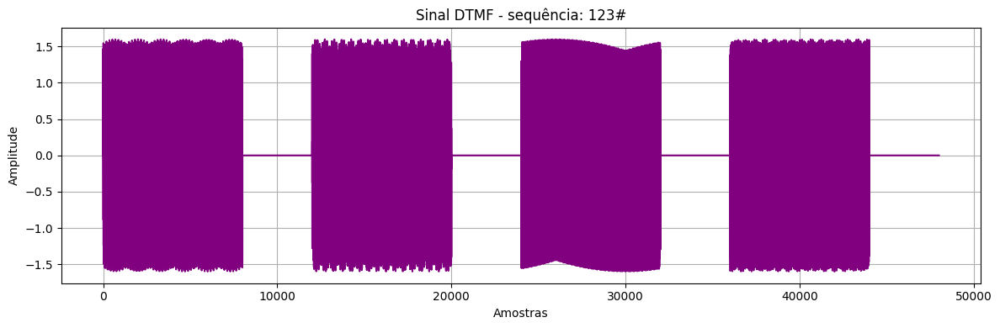

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Mapa de frequências DTMF (duas por tecla)
dtmf_freqs = {
    '1': (697, 1209), '2': (697, 1336), '3': (697, 1477),
    '4': (770, 1209), '5': (770, 1336), '6': (770, 1477),
    '7': (852, 1209), '8': (852, 1336), '9': (852, 1477),
    '*': (941, 1209), '0': (941, 1336), '#': (941, 1477)
}

def dtmf_tone(digits, dur_digito, pausa, amplitude):
    """
    Gera uma sequência de tons DTMF para os dígitos fornecidos.

    Parâmetros:
    - digits: string ou lista com os dígitos (ex: '123#')
    - dur_digito: duração de cada tom (em segundos)
    - pausa: duração do silêncio entre os tons (em segundos)
    - amplitude: entre 0 e 1

    Retorna:
    - sinal: vetor com o som completo
    """
    fs = 8000
    t = np.linspace(0, dur_digito, int(fs * dur_digito), endpoint=False)
    t_pausa = np.zeros(int(fs * pausa))
    sinal = np.array([], dtype=np.float32)

    for d in digits:
        if d not in dtmf_freqs:
            continue  # Ignora caracteres inválidos
        f1, f2 = dtmf_freqs[d]
        tom = amplitude * (np.sin(2*np.pi*f1*t) + np.sin(2*np.pi*f2*t))
        sinal = np.concatenate((sinal, tom, t_pausa))

    return sinal

# uso
seq = '123#'
sinal_dtmf = dtmf_tone(seq, dur_digito=1, pausa=0.5, amplitude=0.8)

# Plotar a forma de onda completa
plt.figure(figsize=(12, 4))
plt.plot(sinal_dtmf, color='purple')
plt.title(f"Sinal DTMF - sequência: {seq}")
plt.xlabel("Amostras")
plt.ylabel("Amplitude")
plt.grid(True)
plt.tight_layout()
plt.show()


# Reproduzir o som (em notebook)
display(Audio(sinal_dtmf, rate=8000))


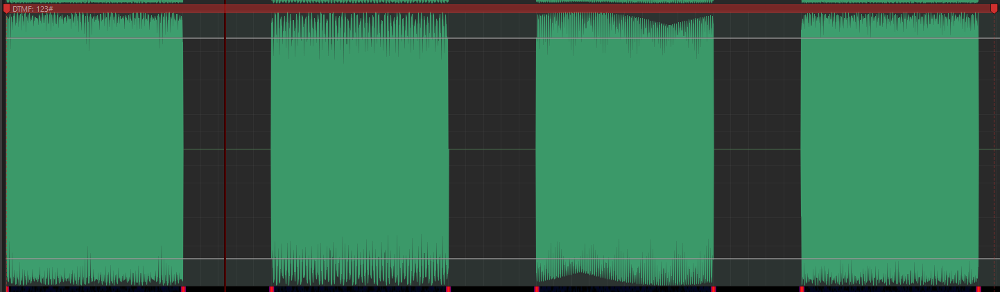

Na imagem acima foi usado o OcenAudio para verificar se o sinal está correto.

3) Criar uma função para remover uma em cada duas amostras de um sinal, criando um novo sinal que tem somente as amostras de índice ímpar do sinal original.

x=np.array([7, 3, 9, 1, 0, 4])

halfsp(x)

resultado esperado: [7, 9, 0]

In [7]:
import numpy as np

def halfsp(x):
    """
    Remove uma em cada duas amostras do sinal.
    Retorna somente as amostras com índices pares (0, 2, 4...).

    Parâmetro:
    x -- vetor NumPy contendo o sinal original

    Retorna:
    Um novo vetor com metade das amostras (as de índice par)
    """
    return x[::2]  # fatiamento: pega de 2 em 2, começando do índice 0

# Exemplo de uso
x = np.array([7, 3, 9, 1, 0, 4])  # Sinal original
resultado = halfsp(x)             # Chama a função

# Exibindo os resultados
print("Sinal original: ", x)
print("Sinal após halfsp: ", resultado)


Sinal original:  [7 3 9 1 0 4]
Sinal após halfsp:  [7 9 0]


4) Criar uma função para criar um novo sinal que insere uma nova amostra entre cada duas amostras. Essa nova amostra é a média das duas amostras vizinhas.

x=np.array([7, 3, 9, 1, 0, 4])

doublesp(x)

[7 5 3 6 9 5 1 0.5 0 2 4]

In [8]:
import numpy as np

def doublesp(x):
    """
    Insere uma nova amostra entre cada duas amostras do vetor original.
    Essa nova amostra é a média das duas amostras vizinhas.

    Parâmetro:
    x -- vetor NumPy contendo o sinal original

    Retorna:
    Um novo vetor com o dobro de tamanho, contendo as médias entre as amostras.
    """
    resultado = []  # Lista para armazenar as amostras novas

    for i in range(len(x) - 1):
        resultado.append(x[i])                           # Adiciona a amostra atual
        media = (x[i] + x[i + 1]) / 2                    # Calcula a média
        resultado.append(media)                         # Adiciona a média

    resultado.append(x[-1])  # Adiciona a última amostra original (sem par)

    return np.array(resultado)

# Exemplo de uso
x = np.array([7, 3, 9, 1, 0, 4])
resultado = doublesp(x)

# Exibindo os resultados
print("Sinal original:       ", x)
print("Sinal com doublesp:   ", resultado)


Sinal original:        [7 3 9 1 0 4]
Sinal com doublesp:    [7.  5.  3.  6.  9.  5.  1.  0.5 0.  2.  4. ]


5) Gere um tom de 220 Hz. Aplique a função halfsp (mantendo a mesma frequencia de amostragem).Escute o resultado antes e depois da aplicação. O que ocorre na frequência e no tempo? Mostre graficamente o resultado na frequência através da transformada de Fourier (implementada pela função numpy.fft).

🔊 Som original (220 Hz):


🔊 Som após halfsp (mantendo fs = 8000 Hz):


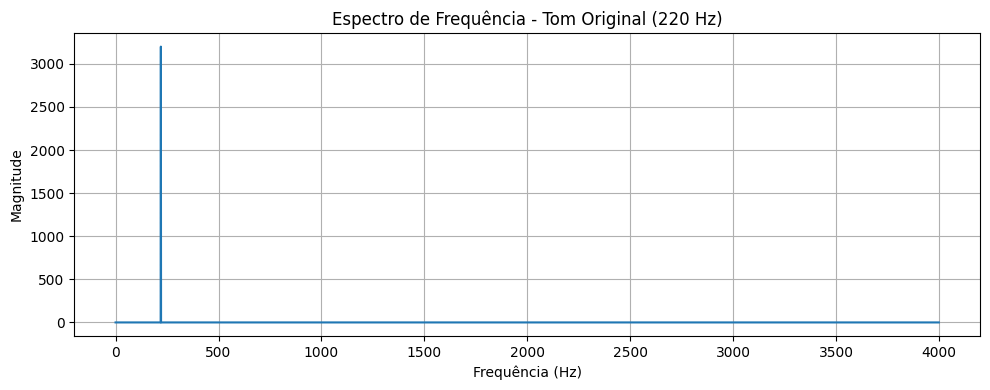

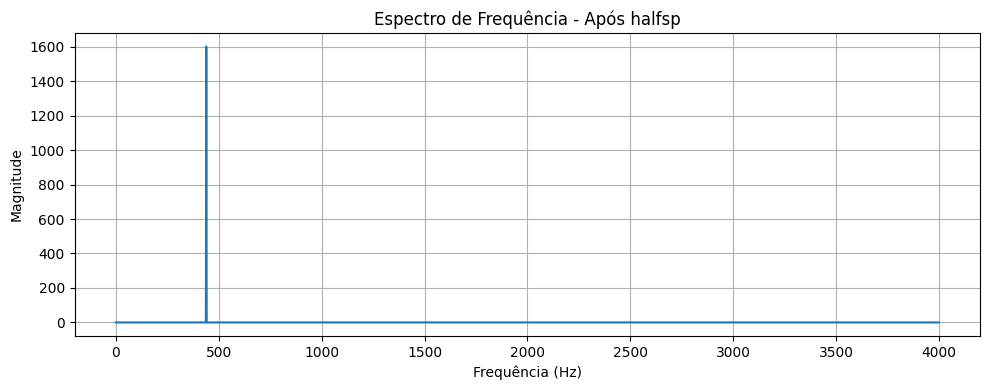

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display

def tonegen(freq, duration, amplitude, fs):
    """
    Gera um tom senoidal com os parâmetros fornecidos.
    """
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    return amplitude * np.sin(2 * np.pi * freq * t)

def halfsp(x):
    """
    Mantém apenas as amostras de índice par (removendo metade do sinal).
    """
    return x[::2]

def plot_fft(signal, fs, title):
    """
    Plota o espectro de magnitude de um sinal.
    """
    N = len(signal)
    freq = np.fft.fftfreq(N, d=1/fs)
    spectrum = np.fft.fft(signal)
    magnitude = np.abs(spectrum)

    plt.figure(figsize=(10, 4))
    plt.plot(freq[:N//2], magnitude[:N//2])
    plt.title(f"Espectro de Frequência - {title}")
    plt.xlabel("Frequência (Hz)")
    plt.ylabel("Magnitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Parâmetros
fs = 8000       # frequência de amostragem
f = 220         # frequência do tom original
duration = 1.0  # duração em segundos
amplitude = 0.8

# 1. Gerar tom de 220 Hz
s220 = tonegen(f, duration, amplitude, fs)

# 2. Aplicar halfsp
s220_half = halfsp(s220)

# 3. Ouvir antes e depois
print("🔊 Som original (220 Hz):")
display(Audio(s220, rate=fs))

print("🔊 Som após halfsp (mantendo fs = 8000 Hz):")
display(Audio(s220_half, rate=fs))

# 4. Mostrar espectro de frequência
plot_fft(s220, fs, "Tom Original (220 Hz)")
plot_fft(s220_half, fs, "Após halfsp")


O que ocorre na frequência e no tempo?

No tempo: o sinal fica mais “rápido”, pois perde metade das amostras. Porém como a frequência de amostragem não é ajustada, o tempo total do sinal diminui.

Na frequência:

O tom original tem pico em 220 Hz.

Após o halfsp, ocorre um efeito de aliasing: o sinal parece conter uma frequência mais alta, próxima de 8000 - 220 = 7780 Hz.

Isso acontece porque o downsampling sem redução da taxa de amostragem provoca espelhamento no espectro.



6) Faça a mesma análise no tempo e frequência em relação à função doublesp.

🔊 Som original (220 Hz):


🔊 Som após doublesp (mesma taxa de amostragem):


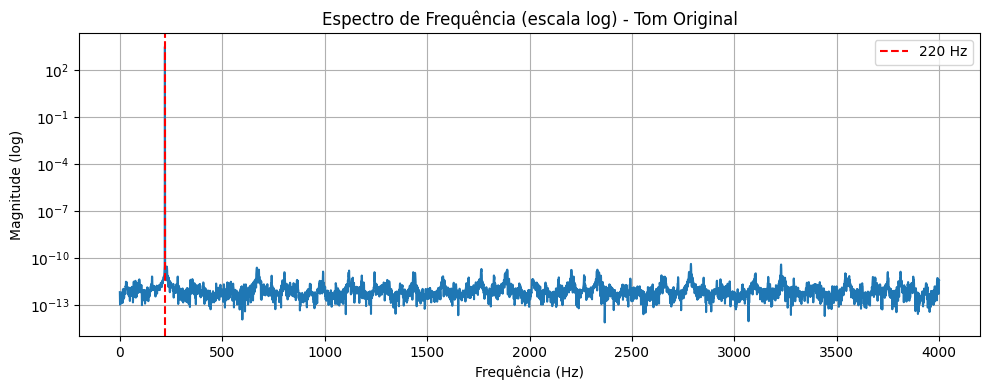

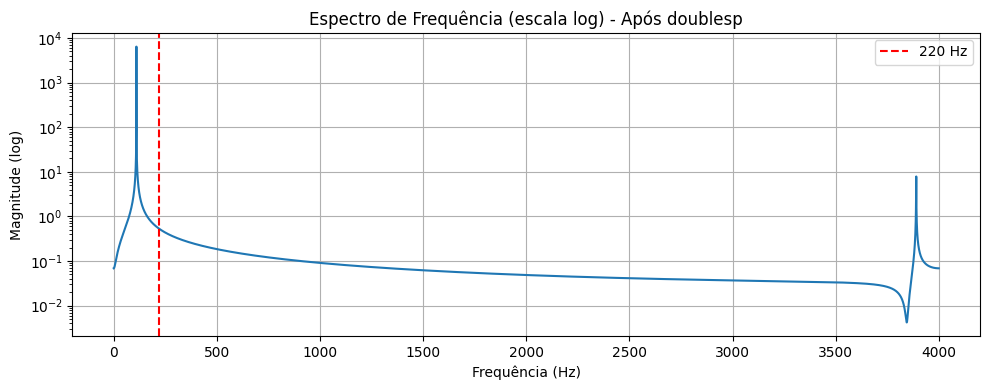

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display

def tonegen(freq, duration, amplitude, fs):
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    return amplitude * np.sin(2 * np.pi * freq * t)

def doublesp(x):
    resultado = []
    for i in range(len(x) - 1):
        resultado.append(x[i])
        media = (x[i] + x[i + 1]) / 2
        resultado.append(media)
    resultado.append(x[-1])
    return np.array(resultado)

def plot_fft(signal, fs, title, f_esperada=None):
    """
    Plota o espectro de magnitude com escala log e linha da frequência esperada.
    """
    N = len(signal)
    freq = np.fft.fftfreq(N, d=1/fs)
    spectrum = np.fft.fft(signal)
    magnitude = np.abs(spectrum)

    plt.figure(figsize=(10, 4))
    plt.plot(freq[:N//2], magnitude[:N//2])
    if f_esperada:
        plt.axvline(x=f_esperada, color='r', linestyle='--', label=f"{f_esperada} Hz")
    plt.yscale('log')  # Escala logarítmica no eixo Y
    plt.title(f"Espectro de Frequência (escala log) - {title}")
    plt.xlabel("Frequência (Hz)")
    plt.ylabel("Magnitude (log)")
    plt.grid(True)
    if f_esperada:
        plt.legend()
    plt.tight_layout()
    plt.show()


# Parâmetros
fs = 8000
f = 220
duration = 1.0
amplitude = 0.8

# 1. Gerar tom original
s220 = tonegen(f, duration, amplitude, fs)

# 2. Aplicar doublesp
s220_double = doublesp(s220)

# 3. Tocar os sinais
print("🔊 Som original (220 Hz):")
display(Audio(s220, rate=fs))

print("🔊 Som após doublesp (mesma taxa de amostragem):")
display(Audio(s220_double, rate=fs))

# 4. Mostrar espectros
plot_fft(s220, fs, "Tom Original", f_esperada=220)
plot_fft(s220_double, fs, "Após doublesp", f_esperada=220)



O que acontece no tempo e na frequência?

Tempo:

O sinal se torna mais longo (quase o dobro do original), pois uma nova amostra é inserida entre cada par de amostras consecutivas. Como a frequência de amostragem permanece inalterada, o sinal resultante soa mais lento, estendendo sua duração total.

Frequência:

A função doublesp insere a média entre dois pontos consecutivos do sinal, suavizando as transições e reduzindo variações bruscas. Esse processo tem um efeito semelhante ao de um filtro passa-baixa, atenuando componentes de alta frequência (harmônicos superiores).

Embora a estrutura geral do sinal seja mantida, a frequência fundamental aparente se reduz, já que o número de amostras por ciclo aumenta. Se a frequência de amostragem não for ajustada proporcionalmente, o espectro mostra a fundamental deslocada para um valor menor. Além disso, o espectro tende a ficar mais limpo, com menor presença de ruídos ou componentes indesejados.

Grave alguma frase com sua voz. Depois, observe e escute o resultado do processamento com:

halfsp
doublesp
numpy.fliplr
numpy.flipud
Apresente os resultados e comente qual o efeito de cada processamento.

In [29]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# === 1. CARREGAR O ÁUDIO (estéreo com compressão) ===
# sr=None mantém a taxa original
audio, fs = librosa.load("audio_dsp2.wav", sr=None, mono=False)

# Transpor se for estéreo (librosa retorna (2, N) em vez de (N, 2))
if audio.ndim == 2:
    audio = audio.T  # (N, 2)

# === 2. DEFINIÇÃO DAS FUNÇÕES ===

def halfsp(x):
    return x[::2, :]

def doublesp(x):
    resultado = []
    for i in range(len(x) - 1):
        resultado.append(x[i])
        media = (x[i] + x[i + 1]) / 2
        resultado.append(media)
    resultado.append(x[-1])
    return np.array(resultado)

# === 3. APLICAR OS PROCESSAMENTOS ===

audio_half   = halfsp(audio)
audio_double = doublesp(audio)
audio_fliplr = np.fliplr(audio)    # troca os canais (L ↔ R)
audio_flipud = np.flipud(audio)    # inverte no tempo
audio_invert = -audio              # espelha verticalmente

# === 4. TOCAR OS ÁUDIOS ===

print("🔊 Áudio original:")
display(Audio(audio.T, rate=fs))  # .T porque Audio espera (2, N)

print("🔊 halfsp (rápido/agudo):")
display(Audio(audio_half.T, rate=fs))

print("🔊 doublesp (lento/grave):")
display(Audio(audio_double.T, rate=fs))

print("🔊 fliplr (troca canais):")
display(Audio(audio_fliplr.T, rate=fs))

print("🔊 flipud (fala invertida):")
display(Audio(audio_flipud.T, rate=fs))

print("🔊 -audio (inversão da forma da onda):")
display(Audio(audio_invert.T, rate=fs))


🔊 Áudio original:


🔊 halfsp (rápido/agudo):


🔊 doublesp (lento/grave):


🔊 fliplr (troca canais):


🔊 flipud (fala invertida):


🔊 -audio (inversão da forma da onda):


halfsp: Reduz a duração total pela metade, o áudio soa mais rápido e mais agudo (efeito de aliasing).

doublesp: Aumenta a duração total (quase o dobro), o  áudio soa mais lento e mais grave (fundamental desloca).

np.fliplr: Troca os canais, o áudio soa igual ao original.


flipud:  Inverte o sinal no tempo (fala de trás para frente), o áudio fica reconhecível ao contrário, como se fosse "reverso"

8) Crie uma função que gere um modelo discreto de um sinal de eco.

Gere sinais com eco a partir de uma gravação de voz (teste antes com um ou dois impulsos para verificar seu código). Experimente com diferentes valores de atenuação e atraso (teste, por exemplo, com fator de atenuação de 0,65 e atraso de 250 ms). Qual o impacto sobre o sinal sintetizado?

In [33]:
import numpy as np
import librosa
from IPython.display import Audio, display

# === 1. Função para adicionar eco ===
def eco_discreto(sinal, fs, atraso_s, atenuacao):
    """
    Adiciona um eco ao sinal com atraso e atenuação.

    Parâmetros:
    - sinal: numpy array (mono ou estéreo em formato [N, 2])
    - fs: frequência de amostragem (Hz)
    - atraso_s: atraso em segundos (T)
    - atenuacao: fator de atenuação (α), entre 0 e 1

    Retorna:
    - sinal com eco (mesma estrutura de entrada)
    """
    if not (0 <= atenuacao <= 1):
        raise ValueError("Atenuação deve estar entre 0 e 1.")
    if atraso_s < 0:
        raise ValueError("Atraso deve ser ≥ 0.")

    atraso_samples = int(fs * atraso_s)

    if sinal.ndim == 2:
        N = sinal.shape[0]
        eco = np.zeros((N + atraso_samples, 2))
        eco[:N, :] += sinal
        eco[atraso_samples:, :] += atenuacao * sinal
    else:
        N = len(sinal)
        eco = np.zeros(N + atraso_samples)
        eco[:N] += sinal
        eco[atraso_samples:] += atenuacao * sinal

    return eco

# === 2. Carregando o áudio (voz gravada) ===
sinal, fs = librosa.load("audio_dsp2.wav", sr=None, mono=False)  # sr=None = mantém taxa original

# Se estéreo, transpor para (N, 2)
if sinal.ndim == 2:
    sinal = sinal.T

# === 3. Aplicando eco (α=0.65, T=0.25s) ===
eco = eco_discreto(sinal, fs, atraso_s=0.25, atenuacao=0.65)

# === 4. Tocando os dois áudios ===
print("🔊 Sinal original:")
display(Audio(sinal if sinal.ndim == 1 else sinal.T, rate=fs))

print("🔊 Sinal com eco (α=0.65, atraso=250 ms):")
display(Audio(eco if eco.ndim == 1 else eco.T, rate=fs))


🔊 Sinal original:


🔊 Sinal com eco (α=0.65, atraso=250 ms):


Com α = 0.65 e T = 250 ms:

O eco é audível, aparecendo logo após a fala principal.

A voz soa mais “espacial”, como se fosse gravada em uma sala ampla.

Quanto maior α, mais forte é o eco.

Quanto maior T, mais tarde o eco aparece.

✔️ IR de 0.1s (4410 amostras): 0.1811 segundos
✔️ IR de 0.5s (22050 amostras): 1.2441 segundos
✔️ IR de 1.0s (44100 amostras): 2.5434 segundos
✔️ IR de 2.0s (88200 amostras): 5.9445 segundos
✔️ IR de 3.0s (132300 amostras): 7.4084 segundos


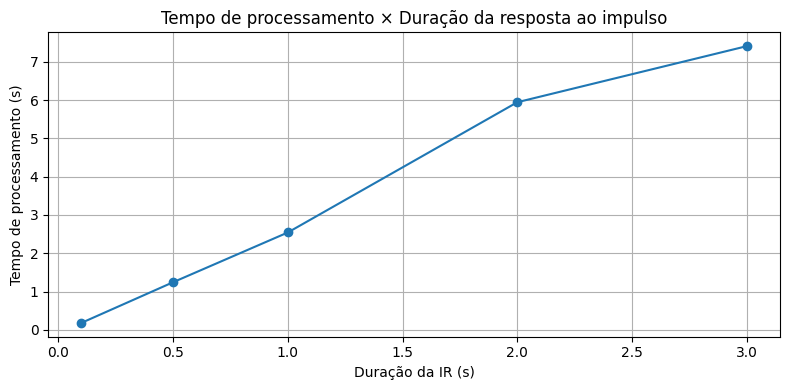

🔊 Voz original:


🔊 Voz com reverberação real (convolução com IR):


In [36]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
import time
from IPython.display import Audio, display

# === 1. Função de convolução com medição de tempo ===
def aplicar_convolucao_e_medir_tempo(voz, ir):
    """
    Convolui o sinal de voz com a IR e mede o tempo de execução.
    """
    inicio = time.time()
    resultado = np.convolve(voz, ir, mode='full')
    fim = time.time()
    tempo_exec = fim - inicio
    return resultado, tempo_exec

# === 2. Carregar o áudio da voz (44.1 kHz) ===
voz, fs_voz = librosa.load("audio_dsp.wav", sr=44100, mono=True)

# === 3. Carregar a resposta ao impulso (48 kHz) ===
ir_original, fs_ir_original = librosa.load("minster1.wav", sr=48000, mono=True)

# === 4. Reamostrar a IR para 44.1 kHz ===
ir = librosa.resample(ir_original, orig_sr=fs_ir_original, target_sr=fs_voz)

# === 5. Avaliar tempos de convolução para diferentes durações da IR ===
duracoes_s = [0.1, 0.5, 1.0, 2.0, 3.0]  # segundos
tempos = []
n_amostras = []

for dur in duracoes_s:
    n = int(fs_voz * dur)
    ir_cortada = ir[:n]  # corta IR
    _, t = aplicar_convolucao_e_medir_tempo(voz, ir_cortada)
    tempos.append(t)
    n_amostras.append(n)
    print(f"✔️ IR de {dur:.1f}s ({n} amostras): {t:.4f} segundos")

# === 6. Gráfico do tempo de processamento ===
plt.figure(figsize=(8, 4))
plt.plot(np.array(n_amostras) / fs_voz, tempos, marker='o')
plt.title("Tempo de processamento × Duração da resposta ao impulso")
plt.xlabel("Duração da IR (s)")
plt.ylabel("Tempo de processamento (s)")
plt.grid(True)
plt.tight_layout()
plt.show()

# === 7. Exemplo final: áudio com convolução completa ===
voz_com_reverberacao, _ = aplicar_convolucao_e_medir_tempo(voz, ir)

print("🔊 Voz original:")
display(Audio(voz, rate=fs_voz))

print("🔊 Voz com reverberação real (convolução com IR):")
display(Audio(voz_com_reverberacao, rate=fs_voz))
